In [1]:
from livelossplot import PlotLosses
from time import sleep
from matplotlib import pyplot as plt
from livelossplot.outputs import MatplotlibPlot
from zipml_sgd import ZipML_SGD
import numpy as np
import time
import pandas as pd
import math
Z = ZipML_SGD(on_pynq=0)
start = time.time()
Z.load_libsvm_data('./mnist/mnist', 10000, 784)
print('Data loaded, time: ' + str(time.time()-start) )
Z.a_normalize(to_min1_1=0, row_or_column='r') # Normalize features of the data set



Data loaded, time: 1.7673649787902832


## 全精度计算

In [2]:
# Set training related parameters
num_epochs = 100
step_size = 1.0/(1 << 12)
step_size_online = 1.0/(2**7)
ka=9
kx=25
kb=ka + kx -1
cost_pos = 1.0
cost_neg = 1.0
xs_CPU = np.zeros((Z.num_features, 10))
groups = {'loss': ['loss']}
outputs = [MatplotlibPlot()]
plotlosses = PlotLosses(groups=groups, outputs=outputs)
for c in range(0, 10):
    start = time.time()
    Z.b_binarize(c) # Binarize the labels of the data set
    x_history = Z.L2SVM_SGD(num_epochs, step_size, cost_pos, cost_neg, step_size_online = step_size_online, online=0, ka=ka, kx=kx, kb=kb, batch_size = 1)
    initial_loss = Z.calculate_L2SVM_loss(np.zeros(Z.num_features), cost_pos, cost_neg)
    epoch_list =[]
    loss_list = []
    time_per_epoch = []
    xs_CPU[:,c] = x_history[:,num_epochs-1]
#     for e in range(0, num_epochs):
#         loss = Z.calculate_L2SVM_loss(x_history[:,e], cost_pos, cost_neg)
#         plotlosses.update({'loss':  (loss)})
#         plotlosses.send()
#         epoch_list.append(e)
#         loss_list.append(loss)

#     for i in range(100):
#         time_per_epoch.append(0.05*Z.early_termination_type1_cout[i]+\
#         0.25*Z.early_termination_type2_cout[i]+\
#         0.45*Z.early_termination_type3_cout[i]+\
#         0.65*Z.early_termination_type4_cout[i]+\
#         0.85*Z.early_termination_type5_cout[i]+\
#         1.00*(10000-Z.early_termination_count[i]))

#     np.save('loss_list_mnist_32.npy',np.array(loss_list))
#     np.save('time_per_epoch_mnist_32.npy',np.array(time_per_epoch))

epoch_index:40 sample_index:8901 x:[-5.44768549e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00 -1.52221650e-05 -3.56820642e-05 -3.57335916e-05
 -5.40173830e-05 -1.50521886e-05 -1.19945884e-03 -2.93055714e-03
  1.02223507e-02  2.92966766e-02  1.47917810e-02 -4.93649123e-04
 -6.32104765e-04 -1.42979666e-03 -4.41593259e-04 -2.51763282e-05
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8921 x:[-5.44671746e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00 -1.52221650e-05 -3.56820642e-05 -3.57335916e-05
 -5.40173830e-05 -1.50521886e-05 -1.19945884e-03 -2.93055714e-03
  1.02223507e-02  2.92966766e-02  1.47917810e-02 -4.93649123e-04
 -6.32104765e-04 -1.42979666e-03 -4.41593259e-04 -2.51763282e-05
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8901 x:[-2.77444749e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -5.39201954e-04 -1.02165567e-03
 -1.50969149e-03 -1.50745484e-03 -7.87631711e-04 -2.39245523e-04
 -1.90263584e-04 -2.97579014e-03 -1.01015338e-03 -5.82041790e-06
 -1.65860945e-05 -2.22673212e-05 -4.56366382e-05 -3.07348995e-05
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8924 x:[-2.76994661e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -5.39201954e-04 -1.02165567e-03
 -1.50969149e-03 -1.50745484e-03 -7.87631711e-04 -2.39245523e-04
 -1.90263584e-04 -2.97579014e-03 -1.01015338e-03 -5.82041790e-06
 -1.65860945e-05 -2.22673212e-05 -4.56366382e-05 -3.07348995e-05
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8901 x:[-5.74481196e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -2.03047467e-03 -8.12336256e-03 -1.21746503e-02 -6.84276049e-03
 -2.41164134e-03 -2.13527613e-03 -8.93733633e-03 -1.07533486e-02
 -2.20787975e-03  1.49855975e-02 -1.96831151e-03 -2.21302926e-03
 -3.77392523e-03 -2.10700810e-03 -8.79959857e-04 -6.50812146e-04
 -2.40615810e-04  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8925 x:[-5.74298054e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -2.03047467e-03 -8.12336256e-03 -1.21746503e-02 -6.84276049e-03
 -2.41164134e-03 -2.13527613e-03 -8.93733633e-03 -1.07533486e-02
 -2.20787975e-03  1.49855975e-02 -1.96831151e-03 -2.21302926e-03
 -3.77392523e-03 -2.10700810e-03 -8.79959857e-04 -6.50812146e-04
 -2.40615810e-04  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8901 x:[-8.44631943e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -6.48540084e-06 -2.01451688e-05
 -6.68711506e-05 -2.57818552e-05 -6.37567423e-05 -1.34181382e-04
 -1.39299670e-04 -9.60016173e-05 -1.84160432e-05  0.00000000e+00
 -5.49146014e-06 -1.97463265e-05 -1.80952374e-05 -9.43414158e-06
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8925 x:[-8.45425148e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -6.48540084e-06 -2.01451688e-05
 -6.68711506e-05 -2.57818552e-05 -6.37567423e-05 -1.34181382e-04
 -1.39299670e-04 -9.60016173e-05 -1.84160432e-05  0.00000000e+00
 -5.49146014e-06 -1.97463265e-05 -1.80952374e-05 -9.43414158e-06
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8901 x:[-3.18068123e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -5.35655449e-05 -3.53080944e-04 -6.47841053e-04 -2.92495857e-03
 -1.60330911e-02 -1.29318354e-02 -1.33563770e-02 -9.18050476e-03
 -2.43051090e-02 -2.56009431e-02 -1.05374152e-02 -6.18331387e-03
 -7.32423847e-04 -1.17323098e-04 -8.25416320e-05 -6.21642498e-03
 -8.63079131e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8924 x:[-3.17969794e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -5.35655449e-05 -3.53080944e-04 -6.47841053e-04 -2.92495857e-03
 -1.60330911e-02 -1.29318354e-02 -1.33563770e-02 -9.18050476e-03
 -2.43051090e-02 -2.56009431e-02 -1.05374152e-02 -6.18331387e-03
 -7.32423847e-04 -1.17323098e-04 -8.25416320e-05 -6.21642498e-03
 -8.63079131e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8901 x:[-7.24108583e-02  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -3.24575673e-05
 -2.01236917e-04 -1.53588320e-05 -6.99243904e-05 -3.78349215e-04
 -6.03541346e-04 -1.49048466e-04 -4.23912199e-05 -2.19519045e-05
 -1.55213569e-04 -4.36200377e-04 -1.47855564e-04 -3.35734923e-05
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8925 x:[-7.29463737e-02  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -3.24575673e-05
 -2.01236917e-04 -1.53588320e-05 -6.99243904e-05 -3.78349215e-04
 -6.03541346e-04 -1.49048466e-04 -4.23912199e-05 -2.19519045e-05
 -1.55213569e-04 -4.36200377e-04 -1.47855564e-04 -3.35734923e-05
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8901 x:[-4.68647200e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.51824893e-03  7.83136161e-03  1.08498897e-02  3.72233107e-03
 -3.81347364e-03 -5.50699140e-03 -2.20847984e-03  2.64858611e-03
  9.85481461e-04 -1.54741172e-02  1.93744341e-03  4.85954739e-03
  2.57906423e-03  2.88387182e-03  1.00482651e-03  3.05107241e-04
  9.30760206e-05  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000


epoch_index:40 sample_index:8925 x:[-4.69008481e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.51824893e-03  7.83136161e-03  1.08498897e-02  3.72233107e-03
 -3.81347364e-03 -5.50699140e-03 -2.20847984e-03  2.64858611e-03
  9.85481461e-04 -1.54741172e-02  1.93744341e-03  4.85954739e-03
  2.57906423e-03  2.88387182e-03  1.00482651e-03  3.05107241e-04
  9.30760206e-05  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00

epoch_index:40 sample_index:8901 x:[-1.89615161e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -1.43437691e-05
 -1.11178293e-04 -9.80522696e-05 -7.84977816e-05 -2.67455020e-04
 -1.20740529e-03 -2.02352746e-03 -8.88741563e-04  0.00000000e+00
  0.00000000e+00 -1.38776211e-06 -1.29944997e-05 -8.95737360e-06
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8926 x:[-1.89682825e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -1.43437691e-05
 -1.11178293e-04 -9.80522696e-05 -7.84977816e-05 -2.67455020e-04
 -1.20740529e-03 -2.02352746e-03 -8.88741563e-04  0.00000000e+00
  0.00000000e+00 -1.38776211e-06 -1.29944997e-05 -8.95737360e-06
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8901 x:[-1.47555721e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -1.58430212e-05 -3.79623668e-05
 -9.36093557e-05 -7.92940804e-05 -1.37485542e-04 -2.09738720e-04
 -6.64354526e-04 -9.74860608e-04 -2.19319103e-04 -2.41824282e-05
 -1.16832821e-03 -5.15514765e-04 -7.42220783e-05 -4.47726090e-05
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8925 x:[-1.47502169e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -1.58430212e-05 -3.79623668e-05
 -9.36093557e-05 -7.92940804e-05 -1.37485542e-04 -2.09738720e-04
 -6.64354526e-04 -9.74860608e-04 -2.19319103e-04 -2.41824282e-05
 -1.16832821e-03 -5.15514765e-04 -7.42220783e-05 -4.47726090e-05
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8901 x:[-9.46080605e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00 -1.31603177e-05 -3.08489166e-05 -5.58653386e-05
 -2.37323653e-04 -2.26417678e-04 -4.05070688e-04 -5.23688794e-04
 -4.20174780e-03 -6.50383246e-03 -3.16967058e-03 -3.57372829e-04
 -5.52656715e-04 -1.58306023e-03 -4.35837097e-04 -4.69258347e-05
 -2.11322150e-05  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8924 x:[-9.46228160e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00 -1.31603177e-05 -3.08489166e-05 -5.58653386e-05
 -2.37323653e-04 -2.26417678e-04 -4.05070688e-04 -5.23688794e-04
 -4.20174780e-03 -6.50383246e-03 -3.16967058e-03 -3.57372829e-04
 -5.52656715e-04 -1.58306023e-03 -4.35837097e-04 -4.69258347e-05
 -2.11322150e-05  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

In [4]:
xs_CPU.shape

(785, 10)

In [6]:
Z.load_libsvm_data('./mnist/mnist.t', 10000, 784)
Z.a_normalize(to_min1_1=0, row_or_column='r');

classes = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
matches_CPU = Z.multi_classification(xs_8, classes)
#matches_floatFSGD = Z.multi_classification(xs_floatFSGD, classes)
#matches_qFSGD = Z.multi_classification(xs_qFSGD, classes)

print('CPU training -> Matches ' + str(matches_CPU) + ' out of ' + str(Z.num_samples) + ' samples.')
#print('FPGA training -> Matches ' + str(matches_floatFSGD) + ' out of ' + str(Z.num_samples) + ' samples.')
# print('1-bit FPGA training -> Matches ' + str(matches_qFSGD) + ' out of ' + str(Z.num_samples) + ' samples.')

CPU training -> Matches 9365 out of 10000 samples.


In [3]:
import matplotlib.pyplot as plt
from matplotlib import rc

time_per_epoch = np.load('time_per_epoch_mnist_8.npy')
sum=0
for i in range(100):
    sum = sum+time_per_epoch[i]
sum = sum/Z.total_count
sum

0.5010371000000001

In [7]:
import matplotlib.pyplot as plt
from matplotlib import rc
epoch_list =[]
loss_list = []
for e in range(0, num_epochs):
    epoch_list.append(e)
time_per_epoch = []
for i in range(100):
    time_per_epoch.append(0.05*Z.early_termination_type1_cout[i]+\
    0.25*Z.early_termination_type2_cout[i]+\
    0.45*Z.early_termination_type3_cout[i]+\
    0.65*Z.early_termination_type4_cout[i]+\
    0.85*Z.early_termination_type5_cout[i]+\
    1.00*(10000-Z.early_termination_count[i]))
    
sum=0
for i in range(100):
    sum = sum+time_per_epoch[i]
sum = sum/Z.total_count
sum 

0.49397454999999996

In [2]:
print(Z.total_count)
print(Z.early_termination_count)

0
0


## online量化

In [3]:
# Set training related parameters
num_epochs = 100
step_size = 1.0/(1 << 12)
step_size_online = 1.0/(2**7)
ka=9
kx=16
kb=16
cost_pos = 1.0
cost_neg = 1.0
xs_16 = np.zeros((Z.num_features, 10))
groups = {'loss': ['loss']}
outputs = [MatplotlibPlot()]
plotlosses = PlotLosses(groups=groups, outputs=outputs)
for c in range(0, 10):
    start = time.time()
    Z.b_binarize(c) # Binarize the labels of the data set
    x_history = Z.L2SVM_SGD(num_epochs, step_size, cost_pos, cost_neg, step_size_online = step_size_online, online=1, ka=ka, kx=kx, kb=kb, batch_size = 1)
    initial_loss = Z.calculate_L2SVM_loss(np.zeros(Z.num_features), cost_pos, cost_neg)
    epoch_list =[]
    loss_list = []
    time_per_epoch = []
    xs_16[:,c] = x_history[:,num_epochs-1]
    #matches_CPU = Z.binary_classification(x_history[:,num_epochs-1])
    print('CPU training -> Matches ' + str(matches_CPU) + ' out of ' + str(Z.num_samples) + ' samples.')
#     for e in range(0, num_epochs):
#         loss = Z.calculate_L2SVM_loss(x_history[:,e], cost_pos, cost_neg)
#         plotlosses.update({'loss':  (loss)})
#         plotlosses.send()
#         epoch_list.append(e)
#         loss_list.append(loss)

#     for i in range(100):
#         time_per_epoch.append(0.05*Z.early_termination_type1_cout[i]+\
#         0.25*Z.early_termination_type2_cout[i]+\
#         0.45*Z.early_termination_type3_cout[i]+\
#         0.65*Z.early_termination_type4_cout[i]+\
#         0.85*Z.early_termination_type5_cout[i]+\
#         1.00*(10000-Z.early_termination_count[i]))

#     np.save('loss_list_mnist_16.npy',np.array(loss_list))
#     np.save('time_per_epoch_mnist_16.npy',np.array(time_per_epoch))
 

epoch_index:40 sample_index:8901 x:[-5.55908203e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.05175781e-05 -3.05175781e-05
 -3.05175781e-05  0.00000000e+00 -1.34277344e-03 -2.80761719e-03
  1.06811523e-02  2.94799805e-02  1.58691406e-02 -4.27246094e-04
 -3.96728516e-04 -1.06811523e-03 -2.74658203e-04 -3.05175781e-05
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8919 x:[-5.55816650e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.05175781e-05 -3.05175781e-05
 -3.05175781e-05  0.00000000e+00 -1.34277344e-03 -2.80761719e-03
  1.06811523e-02  2.94799805e-02  1.58691406e-02 -4.27246094e-04
 -3.96728516e-04 -1.06811523e-03 -2.74658203e-04 -3.05175781e-05
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

CPU training -> Matches 9954 out of 10000 samples.
epoch_index:40 sample_index:8901 x:[-2.82043457e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -4.57763672e-04 -8.85009766e-04
 -1.58691406e-03 -1.52587891e-03 -7.32421875e-04 -1.83105469e-04
 -1.52587891e-04 -3.38745117e-03 -8.85009766e-04  0.00000000e+00
  0.00000000e+00 -3.05175781e-05 -3.05175781e-05 -3.05175781e-05
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.

epoch_index:40 sample_index:8922 x:[-2.81585693e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -4.57763672e-04 -8.85009766e-04
 -1.58691406e-03 -1.52587891e-03 -7.32421875e-04 -1.83105469e-04
 -1.52587891e-04 -3.38745117e-03 -8.85009766e-04  0.00000000e+00
  0.00000000e+00 -3.05175781e-05 -3.05175781e-05 -3.05175781e-05
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

CPU training -> Matches 9954 out of 10000 samples.
epoch_index:40 sample_index:8901 x:[-6.03637695e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -1.64794922e-03 -8.30078125e-03 -1.24206543e-02 -7.04956055e-03
 -1.95312500e-03 -1.43432617e-03 -9.61303711e-03 -1.00097656e-02
 -2.04467773e-03  1.66015625e-02 -1.67846680e-03 -2.38037109e-03
 -3.50952148e-03 -2.10571289e-03 -7.32421875e-04 -3.96728516e-04
 -3.05175781e-05  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.

epoch_index:40 sample_index:8919 x:[-6.04187012e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -1.64794922e-03 -8.30078125e-03 -1.24206543e-02 -7.04956055e-03
 -1.95312500e-03 -1.43432617e-03 -9.61303711e-03 -1.00097656e-02
 -2.04467773e-03  1.66015625e-02 -1.67846680e-03 -2.38037109e-03
 -3.50952148e-03 -2.10571289e-03 -7.32421875e-04 -3.96728516e-04
 -3.05175781e-05  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

CPU training -> Matches 9954 out of 10000 samples.
epoch_index:40 sample_index:8901 x:[-8.60656738e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -3.05175781e-05
 -9.15527344e-05 -3.05175781e-05 -6.10351562e-05 -1.22070312e-04
 -9.15527344e-05 -9.15527344e-05  0.00000000e+00  0.00000000e+00
  0.00000000e+00 -3.05175781e-05  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.

epoch_index:40 sample_index:8922 x:[-8.61480713e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -3.05175781e-05
 -9.15527344e-05 -3.05175781e-05 -6.10351562e-05 -1.22070312e-04
 -9.15527344e-05 -9.15527344e-05  0.00000000e+00  0.00000000e+00
  0.00000000e+00 -3.05175781e-05  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

CPU training -> Matches 9954 out of 10000 samples.
epoch_index:40 sample_index:8901 x:[-3.35327148e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.05175781e-05 -3.35693359e-04 -6.71386719e-04 -4.24194336e-03
 -1.72424316e-02 -1.31530762e-02 -1.24206543e-02 -8.66699219e-03
 -2.54821777e-02 -2.72216797e-02 -1.21765137e-02 -5.73730469e-03
 -1.31225586e-03 -9.15527344e-05 -9.15527344e-05 -5.70678711e-03
 -8.27026367e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.

epoch_index:40 sample_index:8919 x:[-3.35235596e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.05175781e-05 -3.35693359e-04 -6.71386719e-04 -4.24194336e-03
 -1.72424316e-02 -1.31530762e-02 -1.24206543e-02 -8.66699219e-03
 -2.54821777e-02 -2.72216797e-02 -1.21765137e-02 -5.73730469e-03
 -1.31225586e-03 -9.15527344e-05 -9.15527344e-05 -5.70678711e-03
 -8.27026367e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

CPU training -> Matches 9954 out of 10000 samples.
epoch_index:40 sample_index:8901 x:[-1.08154297e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -9.15527344e-05 -3.05175781e-05 -6.10351562e-05 -2.74658203e-04
 -8.54492188e-04 -1.52587891e-04 -6.10351562e-05 -3.05175781e-05
 -6.10351562e-05 -5.18798828e-04 -9.15527344e-05 -3.05175781e-05
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.

epoch_index:40 sample_index:8922 x:[-1.08642578e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -9.15527344e-05 -3.05175781e-05 -6.10351562e-05 -2.74658203e-04
 -8.54492188e-04 -1.52587891e-04 -6.10351562e-05 -3.05175781e-05
 -6.10351562e-05 -5.18798828e-04 -9.15527344e-05 -3.05175781e-05
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

CPU training -> Matches 9954 out of 10000 samples.
epoch_index:40 sample_index:8901 x:[-4.81323242e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.46484375e-03  7.81250000e-03  1.10778809e-02  4.69970703e-03
 -3.38745117e-03 -4.91333008e-03 -2.50244141e-03  1.46484375e-03
 -6.40869141e-04 -1.76086426e-02  1.70898438e-03  4.94384766e-03
  2.44140625e-03  3.08227539e-03  8.54492188e-04  2.74658203e-04
  9.15527344e-05  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.

epoch_index:40 sample_index:8922 x:[-4.81506348e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.46484375e-03  7.81250000e-03  1.10778809e-02  4.69970703e-03
 -3.38745117e-03 -4.91333008e-03 -2.50244141e-03  1.46484375e-03
 -6.40869141e-04 -1.76086426e-02  1.70898438e-03  4.94384766e-03
  2.44140625e-03  3.08227539e-03  8.54492188e-04  2.74658203e-04
  9.15527344e-05  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

CPU training -> Matches 9954 out of 10000 samples.
epoch_index:40 sample_index:8901 x:[-2.09259033e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -1.22070312e-04 -9.15527344e-05 -6.10351562e-05 -2.13623047e-04
 -1.67846680e-03 -1.86157227e-03 -1.28173828e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.

epoch_index:40 sample_index:8922 x:[-2.09320068e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -1.22070312e-04 -9.15527344e-05 -6.10351562e-05 -2.13623047e-04
 -1.67846680e-03 -1.86157227e-03 -1.28173828e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

CPU training -> Matches 9954 out of 10000 samples.
epoch_index:40 sample_index:8901 x:[-1.49731445e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -3.05175781e-05
 -9.15527344e-05 -6.10351562e-05 -1.52587891e-04 -1.52587891e-04
 -5.49316406e-04 -9.15527344e-04 -1.22070312e-04 -3.05175781e-05
 -8.23974609e-04 -3.35693359e-04 -6.10351562e-05 -3.05175781e-05
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.

epoch_index:40 sample_index:8923 x:[-1.49661255e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -3.05175781e-05
 -9.15527344e-05 -6.10351562e-05 -1.52587891e-04 -1.52587891e-04
 -5.49316406e-04 -9.15527344e-04 -1.22070312e-04 -3.05175781e-05
 -8.23974609e-04 -3.35693359e-04 -6.10351562e-05 -3.05175781e-05
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

CPU training -> Matches 9954 out of 10000 samples.
epoch_index:40 sample_index:8901 x:[-9.64721680e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.05175781e-05 -6.10351562e-05
 -2.13623047e-04 -2.13623047e-04 -3.96728516e-04 -2.13623047e-04
 -4.15039062e-03 -6.34765625e-03 -3.57055664e-03 -3.96728516e-04
 -5.18798828e-04 -1.92260742e-03 -5.18798828e-04 -3.05175781e-05
 -3.05175781e-05  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.

epoch_index:40 sample_index:8921 x:[-9.64874268e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.05175781e-05 -6.10351562e-05
 -2.13623047e-04 -2.13623047e-04 -3.96728516e-04 -2.13623047e-04
 -4.15039062e-03 -6.34765625e-03 -3.57055664e-03 -3.96728516e-04
 -5.18798828e-04 -1.92260742e-03 -5.18798828e-04 -3.05175781e-05
 -3.05175781e-05  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

CPU training -> Matches 9954 out of 10000 samples.


In [5]:
# Set training related parameters
num_epochs = 100
step_size = 1.0/(1 << 12)
step_size_online = 1.0/(2**7)
ka=9
kx=16
kb=8
cost_pos = 1.0
cost_neg = 1.0
xs_8 = np.zeros((Z.num_features, 10))
groups = {'loss': ['loss']}
outputs = [MatplotlibPlot()]
plotlosses = PlotLosses(groups=groups, outputs=outputs)
for c in range(0, 10):
    start = time.time()
    Z.b_binarize(c) # Binarize the labels of the data set
    x_history = Z.L2SVM_SGD(num_epochs, step_size, cost_pos, cost_neg, step_size_online = step_size_online, online=1, ka=ka, kx=kx, kb=kb, batch_size = 1)
    initial_loss = Z.calculate_L2SVM_loss(np.zeros(Z.num_features), cost_pos, cost_neg)
    epoch_list =[]
    loss_list = []
    time_per_epoch = []
    xs_8[:,c] = x_history[:,num_epochs-1]
    
#     for e in range(0, num_epochs):
#         loss = Z.calculate_L2SVM_loss(x_history[:,e], cost_pos, cost_neg)
#         plotlosses.update({'loss':  (loss)})
#         plotlosses.send()
#         epoch_list.append(e)
#         loss_list.append(loss)

#     for i in range(100):
#         time_per_epoch.append(0.05*Z.early_termination_type1_cout[i]+\
#         0.25*Z.early_termination_type2_cout[i]+\
#         0.45*Z.early_termination_type3_cout[i]+\
#         0.65*Z.early_termination_type4_cout[i]+\
#         0.85*Z.early_termination_type5_cout[i]+\
#         1.00*(10000-Z.early_termination_count[i]))

#     np.save('loss_list_mnist_8.npy',np.array(loss_list))
#     np.save('time_per_epoch_mnist_8.npy',np.array(time_per_epoch))

epoch_index:40 sample_index:8901 x:[-3.28613281e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -6.10351562e-05
 -3.05175781e-05 -6.10351562e-05 -3.05175781e-05 -2.74658203e-04
 -1.55639648e-03 -5.18798828e-04 -7.32421875e-04 -6.40869141e-04
 -4.27246094e-04 -1.22070312e-04 -2.13623047e-04 -3.05175781e-04
 -2.44140625e-04  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8926 x:[-3.28674316e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -6.10351562e-05
 -3.05175781e-05 -6.10351562e-05 -3.05175781e-05 -2.74658203e-04
 -1.55639648e-03 -5.18798828e-04 -7.32421875e-04 -6.40869141e-04
 -4.27246094e-04 -1.22070312e-04 -2.13623047e-04 -3.05175781e-04
 -2.44140625e-04  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8901 x:[-1.96533203e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -6.10351562e-05
 -3.05175781e-05 -6.10351562e-05 -3.05175781e-05 -1.22070312e-04
 -1.52587891e-04 -9.15527344e-05 -3.05175781e-04 -1.83105469e-04
 -3.05175781e-05 -6.10351562e-05 -1.22070312e-04 -9.15527344e-05
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8924 x:[-1.96716309e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -6.10351562e-05
 -3.05175781e-05 -6.10351562e-05 -3.05175781e-05 -1.22070312e-04
 -1.52587891e-04 -9.15527344e-05 -3.05175781e-04 -1.83105469e-04
 -3.05175781e-05 -6.10351562e-05 -1.22070312e-04 -9.15527344e-05
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8901 x:[-6.53015137e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.25122070e-03  8.75854492e-03
  6.25610352e-03  8.75854492e-03  6.25610352e-03 -8.23974609e-04
 -6.74438477e-03 -1.12609863e-02 -1.19934082e-02 -1.45263672e-02
 -1.32141113e-02 -4.27246094e-03 -9.94873047e-03 -8.69750977e-03
 -3.05175781e-03 -3.05175781e-05  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8925 x:[-6.53015137e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.25122070e-03  8.75854492e-03
  6.25610352e-03  8.75854492e-03  6.25610352e-03 -8.23974609e-04
 -6.74438477e-03 -1.12609863e-02 -1.19934082e-02 -1.45263672e-02
 -1.32141113e-02 -4.27246094e-03 -9.94873047e-03 -8.69750977e-03
 -3.05175781e-03 -3.05175781e-05  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8901 x:[-8.01147461e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -1.22070312e-04
 -1.83105469e-04 -1.83105469e-04 -2.13623047e-04 -1.22070312e-04
 -6.10351562e-05 -3.05175781e-05 -6.10351562e-05 -3.05175781e-05
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8922 x:[-8.01208496e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -1.22070312e-04
 -1.83105469e-04 -1.83105469e-04 -2.13623047e-04 -1.22070312e-04
 -6.10351562e-05 -3.05175781e-05 -6.10351562e-05 -3.05175781e-05
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8901 x:[-3.81652832e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -1.86157227e-03 -1.18103027e-02
 -8.69750977e-03 -2.15148926e-02 -2.33154297e-02 -1.93176270e-02
 -2.86560059e-02 -3.41186523e-02 -1.57470703e-02 -1.55944824e-02
 -1.81274414e-02 -6.68334961e-03 -6.98852539e-03 -2.68554688e-03
 -2.01416016e-03 -1.00708008e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8925 x:[-3.81713867e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -1.86157227e-03 -1.18103027e-02
 -8.69750977e-03 -2.15148926e-02 -2.33154297e-02 -1.93176270e-02
 -2.86560059e-02 -3.41186523e-02 -1.57470703e-02 -1.55944824e-02
 -1.81274414e-02 -6.68334961e-03 -6.98852539e-03 -2.68554688e-03
 -2.01416016e-03 -1.00708008e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8901 x:[-1.24877930e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -1.22070312e-04
 -1.52587891e-04 -1.52587891e-03 -7.62939453e-04 -1.22070312e-04
 -6.10351562e-05 -3.05175781e-05 -6.10351562e-05 -3.05175781e-05
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8926 x:[-1.24877930e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -1.22070312e-04
 -1.52587891e-04 -1.52587891e-03 -7.62939453e-04 -1.22070312e-04
 -6.10351562e-05 -3.05175781e-05 -6.10351562e-05 -3.05175781e-05
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8901 x:[-4.36218262e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -2.22778320e-03 -1.21154785e-02
 -9.39941406e-03 -8.97216797e-03 -4.88281250e-03  1.89208984e-03
  1.40075684e-02  2.58789062e-02  2.39257812e-02  2.17590332e-02
  1.99890137e-02  5.40161133e-03  7.93457031e-03  5.52368164e-03
  1.83105469e-04  3.05175781e-05  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8926 x:[-4.36218262e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -2.22778320e-03 -1.21154785e-02
 -9.39941406e-03 -8.97216797e-03 -4.88281250e-03  1.89208984e-03
  1.40075684e-02  2.58789062e-02  2.39257812e-02  2.17590332e-02
  1.99890137e-02  5.40161133e-03  7.93457031e-03  5.52368164e-03
  1.83105469e-04  3.05175781e-05  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8901 x:[-2.31750488e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -2.80761719e-03
 -1.40380859e-03 -2.80761719e-03 -1.40380859e-03 -2.44140625e-04
 -7.41577148e-03 -3.78417969e-03 -1.61743164e-03 -2.68554688e-03
 -3.78417969e-03 -1.22070312e-04 -2.44140625e-04 -3.05175781e-05
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8924 x:[-2.31811523e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -2.80761719e-03
 -1.40380859e-03 -2.80761719e-03 -1.40380859e-03 -2.44140625e-04
 -7.41577148e-03 -3.78417969e-03 -1.61743164e-03 -2.68554688e-03
 -3.78417969e-03 -1.22070312e-04 -2.44140625e-04 -3.05175781e-05
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8901 x:[-1.60046387e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -6.71386719e-04
 -3.35693359e-04 -6.71386719e-04 -3.66210938e-04 -1.83105469e-04
 -1.61743164e-03 -7.14111328e-03 -1.19018555e-03 -1.34277344e-03
 -9.15527344e-04 -2.74658203e-04 -2.99072266e-03 -5.18798828e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8918 x:[-1.60021973e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -6.71386719e-04
 -3.35693359e-04 -6.71386719e-04 -3.66210938e-04 -1.83105469e-04
 -1.61743164e-03 -7.14111328e-03 -1.19018555e-03 -1.34277344e-03
 -9.15527344e-04 -2.74658203e-04 -2.99072266e-03 -5.18798828e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8901 x:[-8.80371094e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -1.22070312e-04
 -6.10351562e-05 -1.52587891e-04 -1.22070312e-04 -1.22070312e-04
 -1.73950195e-03 -8.14819336e-03 -6.68334961e-03 -7.72094727e-03
 -5.79833984e-04 -6.10351562e-04 -2.10571289e-03 -3.63159180e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

epoch_index:40 sample_index:8925 x:[-8.80371094e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -1.22070312e-04
 -6.10351562e-05 -1.52587891e-04 -1.22070312e-04 -1.22070312e-04
 -1.73950195e-03 -8.14819336e-03 -6.68334961e-03 -7.72094727e-03
 -5.79833984e-04 -6.10351562e-04 -2.10571289e-03 -3.63159180e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.000

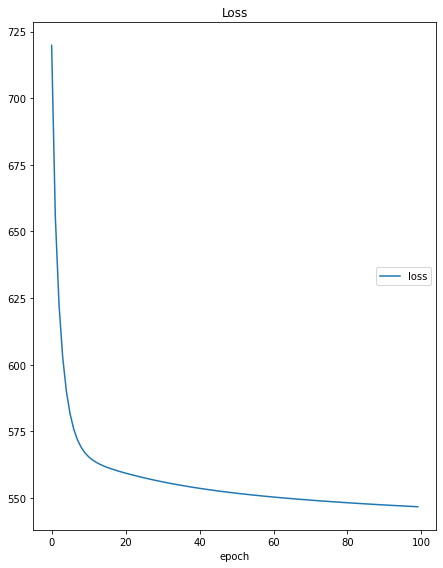

In [2]:
# Set training related parameters
num_epochs = 100
step_size_online = 1.0/(2**7)
step_size = 1.0/(1 << 12)
ka=9
kx=25
kb=ka + kx -1
cost_pos = 1.0
cost_neg = 1.5

xs_CPU = np.zeros((Z.num_features, 10))
groups = {'loss': ['loss']}
outputs = [MatplotlibPlot()]
plotlosses = PlotLosses(groups=groups, outputs=outputs)
for c in range(0, 1):
    start = time.time()
    Z.b_binarize(c) # Binarize the labels of the data set
    #print('b binarized for ' + str(c) + ", time: " + str(time.time()-start) )
    #start = time.time()

    # Train model on the CPU
    x_history = Z.L2SVM_SGD(num_epochs, step_size, cost_pos, cost_neg, step_size_online = step_size_online, online=1, ka=ka, kx=kx, kb=kb)

    #print('Training time: ' + str(time.time()-start) )
    # Print losses after each epoch
    initial_loss = Z.calculate_L2SVM_loss(np.zeros(Z.num_features), cost_pos, cost_neg)
    #print('Initial loss: ' + str(initial_loss))
    for e in range(0, num_epochs):
        loss = Z.calculate_L2SVM_loss(x_history[:,e], cost_pos, cost_neg)
        plotlosses.update({'loss':  (loss)})
        plotlosses.send()
        #print('Epoch ' + str(e) + ' loss: ' + str(loss) )
    xs_CPU[:,c] = x_history[:,num_epochs-1]

In [3]:
print(Z.total_count)
print(Z.early_termination_count)
print(Z.early_termination_type1_cout)
print(Z.early_termination_type2_cout)
print(Z.early_termination_type3_cout)
print(Z.early_termination_type4_cout)

1000000
394106
5621
14147
326076
48262


In [4]:
Z.a.shape

(10000, 785)

## 画饼图

In [20]:
from pyecharts.charts import Pie
from pyecharts import options as opts
job=['提前终止', '非提前终止']
job_count=[429417, 570583]
pie = (
    Pie()
    .add("", [list(i) for i in zip(job,job_count)])
    .set_colors(["orange", "green", "purple", "red", "pink", "orange", "purple","gold"])
    .set_global_opts(title_opts=opts.TitleOpts(title="svm训练中提前终止率"))
    
)
pie.render_notebook()



In [22]:
job=['0-25%', '25%-50%','50%-75%','75%-100%']
job_count=[5627, 14427, 357371, 51992]
pie = (
    Pie()
    .add("", [list(i) for i in zip(job,job_count)])
    .set_colors(["blue", "green", "purple", "red", "pink", "orange", "purple","gold"])
    .set_global_opts(title_opts=opts.TitleOpts(title="提前终止位置"))
    
)
pie.render_notebook()


## 换个数据集

In [4]:
Z = ZipML_SGD(on_pynq=0)
start = time.time()
Z.load_libsvm_data('./gisette/gisette_scale', 5000, 5000)
print('Data loaded, time: ' + str(time.time()-start) )
Z.a_normalize(to_min1_1=0, row_or_column='r') # Normalize features of the data set


Data loaded, time: 20.586021900177002


In [3]:
import pandas as pd
#set_option('display.max_rows',None)
df = pd.DataFrame(Z.a)
df

,0,1,2,3,4,5,6,7,8,9,...,4991,4992,4993,4994,4995,4996,4997,4998,4999,5000
0,1.0,0.550550,0.0,0.495495,0.0,0.0,0.0,0.0,0.976977,0.0,...,0.000000,0.000000,0.0,0.991992,0.991992,0.0,0.000000,0.0,0.000000,0.983984
1,1.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.976977,0.0,...,0.000000,0.475475,0.0,0.991992,0.000000,0.0,0.991992,0.0,0.000000,0.000000
2,1.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000
3,1.0,0.000000,0.0,0.742742,0.0,0.0,0.0,0.0,0.684685,0.0,...,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.674675,0.0,0.000000,0.838839
4,1.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.608608,0.0,...,0.991992,0.000000,0.0,0.828829,0.000000,0.0,0.000000,0.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,1.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.000000,0.000000,0.0,0.980981,0.000000,0.0,0.863864,0.0,0.804805,0.000000
4996,1.0,0.845846,0.0,0.000000,0.0,0.0,0.0,0.0,0.980981,0.0,...,0.000000,0.000000,0.0,0.501502,0.000000,0.0,0.000000,0.0,0.991992,0.413413
4997,1.0,0.000000,0.0,0.925926,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.991992,0.000000,0.0,0.968969,0.000000,0.0,0.663663,0.0,0.000000,0.000000
4998,1.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.995996,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000


In [4]:
xnew_hw=np.load('array_xnew_hw.npy')
xnew_sw=np.load('array_xnew_sw.npy')
df = pd.DataFrame(xnew_hw)
df

,0,1,2,3,4,5,6,7,8,9,...,54,55,56,57,58,59,60,61,62,63
0,-0.000192,0.000000,-0.000039,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,-0.759455
1,-0.003995,-0.016762,-0.004464,-0.040147,-0.000279,-0.030368,-0.016085,-0.004056,-0.000980,-0.005587,...,-0.047801,-0.029729,-0.007829,-0.003922,-4.139125e-03,-0.002381,-0.023836,-0.046274,-0.007845,-0.000001
2,-0.023921,-0.009926,-0.005778,-0.007942,-0.002596,-0.001129,-0.020516,-0.045897,-0.008301,-0.016611,...,-0.023862,-0.065862,-0.067724,-0.000309,-3.243852e-04,-0.008950,-0.006572,-0.018105,-0.001644,-0.008778
3,-0.000213,-0.000580,-0.000010,-0.000333,-0.015909,-0.105299,-0.109885,-0.013534,-0.007851,-0.000643,...,-0.004060,-0.002093,-0.010859,-0.001240,-9.775162e-06,-0.000546,-0.017627,-0.032977,-0.086679,-0.048957
4,-0.016236,-0.006038,-0.000611,-0.015076,-0.008118,-0.022825,-0.027188,-0.027491,-0.000018,-0.002423,...,-0.005538,-0.009459,-0.018799,-0.001099,-1.536682e-07,-0.000264,-0.001139,-0.005037,-0.005750,-0.002696
5,-0.044695,-0.022548,-0.003353,-0.035263,-0.049213,-0.013096,-0.010378,-0.009637,-0.010407,-0.020018,...,-0.035288,-0.019600,-0.016728,-0.001548,-2.590263e-02,-0.026527,-0.058595,-0.004036,-0.008238,-0.002869
6,-0.000550,-0.039597,-0.022733,-0.008061,-0.016726,-0.007853,-0.016190,-0.041595,-0.028099,-0.058369,...,0.000000,0.000000,-0.004000,-0.052650,-3.570128e-02,-0.035652,-0.016276,-0.000497,-0.033539,-0.030147
7,-0.010293,-0.031769,-0.030573,-0.066860,-0.001794,-0.000601,0.000000,-0.000025,-0.008868,-0.003359,...,-0.001009,-0.000649,-0.007820,-0.020180,-3.608650e-02,-0.049688,-0.005943,-0.000718,0.000000,0.000000
8,-0.015623,-0.008797,-0.039094,-0.002459,-0.005043,-0.007843,-0.005065,-0.028499,-0.021162,-0.005606,...,-0.020307,-0.007882,-0.007802,-0.028865,-2.193749e-02,-0.017700,-0.000279,-0.000672,-0.033692,-0.008919
9,-0.007876,-0.001694,-0.001040,-0.002263,-0.032467,-0.033493,-0.008427,-0.000641,-0.000001,-0.016121,...,-0.004997,-0.001051,-0.005660,-0.002476,-1.082398e-02,-0.026595,-0.035078,-0.008911,-0.040447,-0.023372


## 全精度的

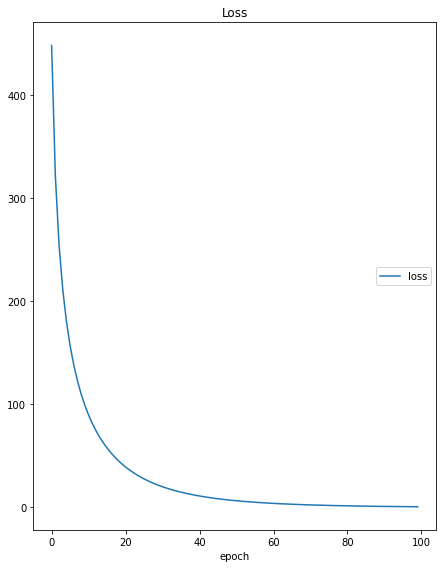

In [5]:
# Set training related parameters
num_epochs = 100
step_size_online = 1.0/(2**7)
step_size = 1.0/(1 << 12)
ka=9
kx=25
cost_pos = 1.0
cost_neg = 1.5

xs_CPU = np.zeros((Z.num_features, 10))
groups = {'loss': ['loss']}
outputs = [MatplotlibPlot()]
plotlosses = PlotLosses(groups=groups, outputs=outputs)
for c in range(0, 1):
    start = time.time()
    Z.b_binarize(1.0) # Binarize the labels of the data set
    #print('b binarized for ' + str(c) + ", time: " + str(time.time()-start) )
    #start = time.time()

    # Train model on the CPU
    x_history = Z.L2SVM_SGD(num_epochs, step_size, cost_pos, cost_neg, step_size_online = step_size_online, online=0, ka=ka, kx=kx)

    #print('Training time: ' + str(time.time()-start) )
    # Print losses after each epoch
    initial_loss = Z.calculate_L2SVM_loss(np.zeros(Z.num_features), cost_pos, cost_neg)
    #print('Initial loss: ' + str(initial_loss))
    for e in range(0, num_epochs):
        loss = Z.calculate_L2SVM_loss(x_history[:,e], cost_pos, cost_neg)
        plotlosses.update({'loss':  (loss)})
        plotlosses.send()
        #print('Epoch ' + str(e) + ' loss: ' + str(loss) )
    xs_CPU[:,c] = x_history[:,num_epochs-1]

## online量化

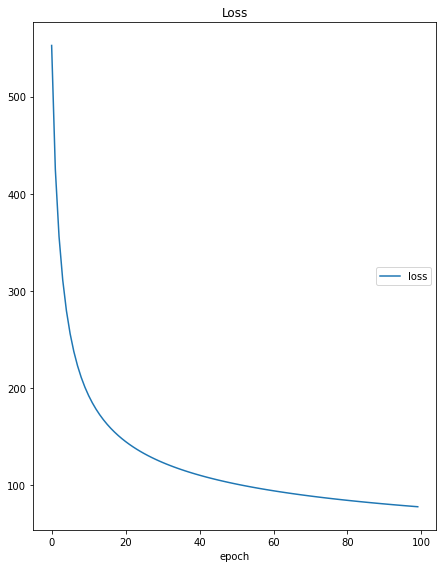

In [5]:
# Set training related parameters
num_epochs = 100
step_size_online = 1.0/(2**7)
step_size = 1.0/(1 << 12)
ka=9
kx=25
cost_pos = 1.0
cost_neg = 1.5

xs_CPU = np.zeros((Z.num_features, 10))
groups = {'loss': ['loss']}
outputs = [MatplotlibPlot()]
plotlosses = PlotLosses(groups=groups, outputs=outputs)
for c in range(0, 1):
    start = time.time()
    Z.b_binarize(1.0) # Binarize the labels of the data set
    #print('b binarized for ' + str(c) + ", time: " + str(time.time()-start) )
    #start = time.time()

    # Train model on the CPU
    x_history = Z.L2SVM_SGD(num_epochs, step_size, cost_pos, cost_neg, step_size_online = step_size_online, online=1, ka=ka, kx=kx)

    #print('Training time: ' + str(time.time()-start) )
    # Print losses after each epoch
    initial_loss = Z.calculate_L2SVM_loss(np.zeros(Z.num_features), cost_pos, cost_neg)
    #print('Initial loss: ' + str(initial_loss))
    for e in range(0, num_epochs):
        loss = Z.calculate_L2SVM_loss(x_history[:,e], cost_pos, cost_neg)
        plotlosses.update({'loss':  (loss)})
        plotlosses.send()
        #print('Epoch ' + str(e) + ' loss: ' + str(loss) )
    xs_CPU[:,c] = x_history[:,num_epochs-1]

In [6]:
print(Z.total_count)
print(Z.early_termination_count)

500000
194039


In [6]:
0.020814037416130304 * 0.00390625

8.1304833656759e-05